# Long Notebook
Xtreme Gorilla Bowling [056]: Cristiano Gambirasio(105501) and Lasse Lemke (104902)

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from skopt.space import Real, Integer
from sklearn.ensemble import RandomForestRegressor
from sklearn.linear_model import LinearRegression
from skopt import BayesSearchCV
from sklearn.pipeline import Pipeline
from xgboost import XGBRegressor
from sklearn.model_selection import PredefinedSplit, GridSearchCV
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor

# suppress future warnings
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

# Data Wrapper Class

During to project we noticed that small changes in the preprocessing take lots of effort and often results in errors. 
To have a more flexible and easier way to preprocess, aggregate and divide (train/test) the data, we created a class that acts as a wrapper for all the data. 
All the processing that we discuss in the next sections is done in this class.

In [16]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestRegressor
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from skopt.space import Real, Categorical, Integer

from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import PredefinedSplit

from sklearn.base import BaseEstimator, TransformerMixin


class DataWrapper:
    def __init__(self,
                 impute_strategy = 'fbfill',
                 aggregation_strats = ['mean'],
                 y_scalers = None,
                 transform_pred_strategy = ['clip'],
                 training_filters=False,
                 validation_filters=False,
                 test_filters=False,
                 bagging_filters=False, # these are applied additionally to the other filters on val, test, sub
                 ):
        
        self.impute_strategy = impute_strategy
        self.aggregation_strats = aggregation_strats
        #self.date_columns = date_columns
        self.y_scalers = y_scalers
        self.transform_pred_strategy = transform_pred_strategy
        self.training_filters = training_filters
        self.validation_filters = validation_filters
        self.test_filters = test_filters
        self.bagging_filters = bagging_filters

        self.basic_features = [
            'isEstimated',
            'delta_forecast',
            'date_forecast',
            #'hourDayMonthYear',
            'dayMonthYear',
            'monthYear',
            'month',
            'hour',
        ]

        self.X = None
        self.X_agg = None

        self.X_sub = None 
        self.X_sub_agg = None

        self.train_idx = None
        self.val_idx = None
        self.test_idx = None

        self.train_agg_idx = None
        self.val_agg_idx = None
        self.test_agg_idx = None

        self._readData()
        self._set_idxs()

    def _readData(self):
        # Read data
        train_a = pd.read_parquet('A/train_targets.parquet')
        train_b = pd.read_parquet('B/train_targets.parquet')
        train_c = pd.read_parquet('C/train_targets.parquet')

        X_train_estimated_a = pd.read_parquet('A/X_train_estimated.parquet')
        X_train_estimated_b = pd.read_parquet('B/X_train_estimated.parquet')
        X_train_estimated_c = pd.read_parquet('C/X_train_estimated.parquet')

        X_train_observed_a = pd.read_parquet('A/X_train_observed.parquet')
        X_train_observed_b = pd.read_parquet('B/X_train_observed.parquet')
        X_train_observed_c = pd.read_parquet('C/X_train_observed.parquet')

        X_test_estimated_a = pd.read_parquet('A/X_test_estimated.parquet')
        X_test_estimated_b = pd.read_parquet('B/X_test_estimated.parquet')
        X_test_estimated_c = pd.read_parquet('C/X_test_estimated.parquet')

        # Adding building ID
        train_a['building_id'] = 'a'
        train_b['building_id'] = 'b'
        train_c['building_id'] = 'c'

        X_train_estimated_a['building_id'] = 'a'
        X_train_estimated_b['building_id'] = 'b'
        X_train_estimated_c['building_id'] = 'c'

        X_train_observed_a['building_id'] = 'a'
        X_train_observed_b['building_id'] = 'b'
        X_train_observed_c['building_id'] = 'c'

        X_test_estimated_a['building_id'] = 'a'
        X_test_estimated_b['building_id'] = 'b'
        X_test_estimated_c['building_id'] = 'c'

        # Combine Data
        X_o = pd.concat([X_train_observed_a, X_train_observed_b, X_train_observed_c])
        X_e = pd.concat([X_train_estimated_a, X_train_estimated_b, X_train_estimated_c])
        X_submission = pd.concat([X_test_estimated_a, X_test_estimated_b, X_test_estimated_c]).reset_index(drop=True)
        y = pd.concat([train_a, train_b, train_c]).dropna(subset=['pv_measurement']).rename(columns={'time': 'hourDayMonthYear'}).reset_index(drop=True)

        # Add isEstimated column
        X_o['isEstimated'] = 0
        X_e['isEstimated'] = 1
        X_submission['isEstimated'] = 1


        # Combine
        X = pd.concat([X_o, X_e]).reset_index(drop=True)

        # Create additional feature for estimated data "delta_forecast"
        X['delta_forecast'] = (X['date_forecast']-X['date_calc']).apply(lambda x: x.total_seconds() / 3600)
        X_submission['delta_forecast'] = (X_submission['date_forecast']-X_submission['date_calc']).apply(lambda x: x.total_seconds() / 3600)

        X = self._cleanData(X) # dont apply to submission data

        y = self._cleanY(y)
        X = self._addTimeFeatures(X)
        X = self._addFeatureInteractions_preAgg(X)
        X = self._addAggFeatures_preAgg(X)
        X = self._addLagFeatures_preAgg(X)
        X = self._cleanX(X)
        X_agg, y_agg = self._aggregateData(X, y)


        # merge x and y to ensure that we have the same indices
        XY_TEMP = X.merge(y, on=['building_id', 'hourDayMonthYear'], how='inner')
        X = XY_TEMP.drop(columns=['pv_measurement'])
        y = XY_TEMP[['building_id', 'hourDayMonthYear', 'pv_measurement']]

        XY_TEMP_AGG = X_agg.merge(y_agg, on=['building_id', 'hourDayMonthYear'], how='inner')
        X_agg = XY_TEMP_AGG.drop(columns=['pv_measurement'])
        y_agg = XY_TEMP_AGG[['building_id', 'hourDayMonthYear', 'pv_measurement']]

        self.y_agg_scaled = self.transform_y(y_agg['pv_measurement'], X_agg)
        self.y_scaled = self.transform_y(y['pv_measurement'], X)

        self.X_agg = X_agg
        self.y_agg = y_agg['pv_measurement']
        self.X = X
        self.y = y['pv_measurement']
        
        X_submission = self._addTimeFeatures(X_submission)
        X_submission = self._addFeatureInteractions_preAgg(X_submission)
        X_submission = self._addAggFeatures_preAgg(X_submission)
        X_submission = self._addLagFeatures_preAgg(X_submission)
        X_submission = self._cleanX(X_submission)
        X_submission_agg, _ = self._aggregateData(X_submission)

        self.X_sub = X_submission
        self.X_sub_agg = X_submission_agg


    def _cleanData(self, X):
        X = X[~((X['building_id'] == 'c') & (X['date_forecast'] < '2019-09-06'))] # C is powered on on this day -> weird measurements
        X = X[~((X['building_id'] == 'c') & (X['date_forecast'].between('2020-05-13','2020-05-14')))] # C is powered on on this day -> weird measurements

        # low value analysis
        remove_idx_1 = (X['date_forecast'].between('2019-06-05 15:59:00', '2019-06-06 17:59:00')) & (X['building_id'] == 'a') # weird 0/low values
        remove_idx_2 = (X['date_forecast'].between('2020-05-13 01:59:00', '2020-05-13 12:59:00')) & (X['building_id'] == 'b') # probably to low values
        remove_idx_3 = (X['date_forecast'].between('2022-05-02 07:59:00', '2022-05-02 09:59:00')) & (X['building_id'] == 'b') # low/0 values
        remove_idx_4 = (X['date_forecast'].between('2022-05-02 11:59:00', '2022-05-02 12:59:00')) & (X['building_id'] == 'b') # low/0 values
        remove_idx_5 = (X['date_forecast'].between('2020-05-11 00:59:00', '2020-05-12 12:59:00')) & (X['building_id'] == 'c') # way too low production
        remove_idx_6 = (X['date_forecast'].between('2023-04-26 00:59:00', '2023-04-26 13:59:00')) & (X['building_id'] == 'c') # way too low production

        # snow analysis
        snow_remove_idx1 =  (X['date_forecast'].between('2020-03-28 00:00:00','2020-04-01 00:00:00')) & (X['building_id'] == 'c') 
        snow_remove_idx2 =  (X['date_forecast'].between('2020-03-29 00:00:00','2020-04-02 00:00:00')) & (X['building_id'] == 'b') 
        snow_remove_idx3 =  (X['date_forecast'].between('2020-04-03 00:00:00','2020-04-06 00:00:00')) & (X['building_id'] == 'c') 
        snow_remove_idx4 =  (X['date_forecast'].between('2021-04-09 00:00:00','2021-04-11 00:00:00')) & (X['building_id'] == 'a') 
        snow_remove_idx5 =  (X['date_forecast'].between('2022-04-01 00:00:00','2022-04-08 00:00:00'))
        snow_remove_idx6 =  (X['date_forecast'].between('2022-04-07 00:00:00','2022-04-13 00:00:00')) & (X['building_id'] == 'b')
        snow_remove_idx7 =  (X['date_forecast'].between('2023-04-01 00:00:00','2023-04-11 00:00:00')) & (X['building_id'] == 'c')
        snow_remove_idx_8 = (X['date_forecast'].between('2021-04-06 00:00:00', '2021-04-15 00:00:00')) & (X['building_id'] == 'c') # way too low production

        # spikes at negative sun elevation
        weird_val_night_idx_1 = X['date_forecast'].between('2022-11-25 15:59:00', '2022-11-25 18:59:00') & (X['building_id'] == 'b')
        weird_val_night_idx_2 = X['date_forecast'].between('2023-03-28 00:59:00', '2023-03-28 03:59:00') & (X['building_id'] == 'b')

        remove_idx = remove_idx_1 | remove_idx_2 | remove_idx_3 | remove_idx_4 | remove_idx_5 | remove_idx_6 | snow_remove_idx1 | snow_remove_idx2 | snow_remove_idx3 | snow_remove_idx4 | snow_remove_idx5 | snow_remove_idx6 | snow_remove_idx7 | snow_remove_idx_8 | weird_val_night_idx_1 | weird_val_night_idx_2

        X = X[~remove_idx].reset_index(drop=True)

        return X
    
    def _cleanY(self, y):
        # Cleaning pv_measurement
        eq_prev_row = (
            ((y.pv_measurement == y.pv_measurement.shift(-2)) & (y.pv_measurement == y.pv_measurement.shift(-1))) |
            ((y.pv_measurement == y.pv_measurement.shift(-1)) & (y.pv_measurement == y.pv_measurement.shift(1))) | 
            (y.pv_measurement == y.pv_measurement.shift(1)) & (y.pv_measurement == y.pv_measurement.shift(2))
            ) & (y.pv_measurement > 0)
        y = y[~eq_prev_row].reset_index(drop=True) # Mostly Solar Panel B has some constant values for up to 1000 measurements


        zeroData_24h = y.groupby(['building_id'])['pv_measurement'].transform(lambda x: x.rolling(24*4, 24*4).sum()) == 0
        for i in range(1,24*4):
            zeroData_24h = zeroData_24h | zeroData_24h.copy(deep=True).shift(-1)
        y = y[~zeroData_24h].reset_index(drop=True) # Solar Panels B and C have some 0 values for longer than 24h, also in summer

        return y
    
    def _cleanX(self, X):
        # drop columns
        # impute and drop columns

        drop_cols = [
            'elevation:m',
            ]

        # pressure_cols = [col for col in X.columns if 'pressure' in col]
        # drop_cols += pressure_cols 
        
        drop_cols += [col for col in X.columns if ('snow' in col)]

        X = X.drop(columns=drop_cols)

        X['delta_forecast'] = X['delta_forecast'].fillna(0)

        return X

    def _addTimeFeatures(self, X):
        X['hourDayMonthYear'] = X['date_forecast'].dt.floor('H')
        X['dayMonthYear'] = X['date_forecast'].dt.floor('D')
        X['monthYear'] = X['date_forecast'].dt.to_period('M')

        X['month'] = X['date_forecast'].dt.month
        X['hour'] = X['date_forecast'].dt.hour

        return X
    
    def _addFeatureInteractions_preAgg(self, X):
        # sum
        X['GHI'] = X['diffuse_rad:W'] + X['direct_rad:W']

        # arctan
        X['wind_angle'] = np.arctan2(X['wind_speed_u_10m:ms'], X['wind_speed_v_10m:ms'])

        # product
        X['temp*GHI'] = X['GHI'] * X['t_1000hPa:K']
        X['wind*humidity'] = X['wind_speed_10m:ms'] * X['relative_humidity_1000hPa:p']
        X['sun_height*diff_rad'] = X['sun_elevation:d'] * X['diffuse_rad:W']

        # sin/cos
        X['wind_angle_sin'] = np.sin(X['wind_angle'])
        X['wind_angle_cos'] = np.cos(X['wind_angle'])

        X['hour_sin'] = np.sin(X['hour'] * (2. * np.pi / 24))
        X['hour_cos'] = np.cos(X['hour'] * (2. * np.pi / 24))

        return X
    
    def _addAggFeatures_preAgg(self, X):
        # add daily mean and std of GHI
        X['GHI_daily_mean'] = X.groupby(['building_id', 'dayMonthYear'])['GHI'].transform('mean')
        X['GHI_daily_std'] = X.groupby(['building_id', 'dayMonthYear'])['GHI'].transform('std')

        X['effective_cloud_cover_5h_mean'] = X.groupby(['building_id'])['effective_cloud_cover:p'].transform(lambda x: x.rolling(5*4+1, 1, center=True).mean())
        return X

    def _aggregateData(self, X, y=None):
        # basic columns --> should be equal in all aggregation strategies
        X_ASSEMBLE = X[['building_id', 'hourDayMonthYear']+self.basic_features].groupby(['building_id', 'hourDayMonthYear']).nth(0).set_index(['building_id', 'hourDayMonthYear']) # get empty DF with only index
        #X_ASSEMBLE = X[['building_id', 'hourDayMonthYear']].drop_duplicates().reset_index(drop=True)

        for agg_strat in self.aggregation_strats:
            
            # set index is needed as nth(x) seems to reset the index after grouping
            if agg_strat == 'mean':
                X_TEMP = X.drop(columns=self.basic_features).groupby(['building_id', 'hourDayMonthYear']).mean()
                X_TEMP.columns = ['mean_' + col for col in X_TEMP.columns]
                X_ASSEMBLE = X_ASSEMBLE.merge(X_TEMP, how='inner', left_index=True, right_index=True)
            elif agg_strat == '00':
                X_TEMP = X.sort_values('date_forecast').drop(columns=self.basic_features).groupby(['building_id', 'hourDayMonthYear']).nth(0).set_index(['building_id', 'hourDayMonthYear'])
                X_TEMP.columns = ['00_' + col for col in X_TEMP.columns]
                X_ASSEMBLE = X_ASSEMBLE.merge(X_TEMP, how='inner', left_index=True, right_index=True)
            elif agg_strat == '15':
                X_TEMP = X.sort_values('date_forecast').drop(columns=self.basic_features).groupby(['building_id', 'hourDayMonthYear']).nth(1).set_index(['building_id', 'hourDayMonthYear'])
                X_TEMP.columns = ['15_' + col for col in X_TEMP.columns]
                X_ASSEMBLE = X_ASSEMBLE.merge(X_TEMP, how='inner', left_index=True, right_index=True)
            elif agg_strat == '30':
                X_TEMP = X.sort_values('date_forecast').drop(columns=self.basic_features).groupby(['building_id', 'hourDayMonthYear']).nth(2).set_index(['building_id', 'hourDayMonthYear'])
                X_TEMP.columns = ['30_' + col for col in X_TEMP.columns]
                X_ASSEMBLE = X_ASSEMBLE.merge(X_TEMP, how='inner', left_index=True, right_index=True)
            elif agg_strat == '45':
                X_TEMP = X.sort_values('date_forecast').drop(columns=self.basic_features).groupby(['building_id', 'hourDayMonthYear']).nth(3).set_index(['building_id', 'hourDayMonthYear'])
                X_TEMP.columns = ['45_' + col for col in X_TEMP.columns]
                X_ASSEMBLE = X_ASSEMBLE.merge(X_TEMP, how='inner', left_index=True, right_index=True)
            elif agg_strat == 'min':
                X_TEMP = X.drop(columns=self.basic_features).groupby(['building_id', 'hourDayMonthYear']).min()
                X_TEMP.columns = ['min_' + col for col in X_TEMP.columns]
                X_ASSEMBLE = X_ASSEMBLE.merge(X_TEMP, how='inner', left_index=True, right_index=True)
            elif agg_strat == 'max':
                X_TEMP = X.drop(columns=self.basic_features).groupby(['building_id', 'hourDayMonthYear']).max()
                X_TEMP.columns = ['max_' + col for col in X_TEMP.columns]
                X_ASSEMBLE = X_ASSEMBLE.merge(X_TEMP, how='inner', left_index=True, right_index=True)
            elif agg_strat == 'std':
                X_TEMP = X.drop(columns=self.basic_features).groupby(['building_id', 'hourDayMonthYear']).std()
                X_TEMP.columns = ['std_' + col for col in X_TEMP.columns]
                X_ASSEMBLE = X_ASSEMBLE.merge(X_TEMP, how='inner', left_index=True, right_index=True)
            elif agg_strat == 'median':
                X_TEMP = X.drop(columns=self.basic_features).groupby(['building_id', 'hourDayMonthYear']).median()
                X_TEMP.columns = ['median_' + col for col in X_TEMP.columns]
                X_ASSEMBLE = X_ASSEMBLE.merge(X_TEMP, how='inner', left_index=True, right_index=True)

        X_ASSEMBLE = X_ASSEMBLE.reset_index().copy() # get building_id and hourDayMonthYear back as columns
        if y is not None:
            y = y.copy()
        # y is already aggregated
        return X_ASSEMBLE, y

    def _addLagFeatures_preAgg(self, X):
        X['GHI_lag_-1h'] = X.groupby(['building_id'])['GHI'].shift(-1*4)
        X['GHI_lag_1h'] = X.groupby(['building_id'])['GHI'].shift(1*4)

        X['temp*GHI_lag_-1h'] = X.groupby(['building_id'])['temp*GHI'].shift(-1*4)
        X['temp*GHI_lag_1h'] = X.groupby(['building_id'])['temp*GHI'].shift(1*4)
        return X

    def get_train(self,aggregated,drop_val=True,drop_test=True,y_scaled=False):
        if aggregated:
            keep_idx = self.train_agg_idx
            if drop_val:
                keep_idx = keep_idx & ~self.val_agg_idx
            if drop_test:
                keep_idx = keep_idx & ~self.test_agg_idx

            if y_scaled:
                return self.X_agg[keep_idx].reset_index(drop=True), self.y_agg_scaled[keep_idx].reset_index(drop=True)
            else:
                return self.X_agg[keep_idx].reset_index(drop=True), self.y_agg[keep_idx].reset_index(drop=True)

        else:
            keep_idx = self.train_idx
            if drop_val:
                keep_idx = keep_idx & ~self.val_idx
            if drop_test:
                keep_idx = keep_idx & ~self.test_idx
            
            if y_scaled:
                return self.X[keep_idx].reset_index(drop=True), self.y_scaled[keep_idx].reset_index(drop=True)
            else:
                return self.X[keep_idx].reset_index(drop=True), self.y[keep_idx].reset_index(drop=True)


    def get_val(self, aggregated,y_scaled=False):
        if aggregated:
            X_val = self.X_agg[self.val_agg_idx]
            y_val = self.y_agg[self.val_agg_idx]
        else:
            X_val = self.X[self.val_idx]
            y_val = self.y[self.val_idx]
        if y_scaled:
            return X_val.reset_index(drop=True), self.y_agg_scaled[self.val_agg_idx].reset_index(drop=True)
        else:
            return X_val.reset_index(drop=True), y_val.reset_index(drop=True)

    def get_test(self, aggregated,y_scaled=False):
        if aggregated:
            X_test = self.X_agg[self.test_agg_idx]
            y_test = self.y_agg[self.test_agg_idx]
        else:
            X_test = self.X[self.test_idx]
            y_test = self.y[self.test_idx]
        if y_scaled:
            return X_test.reset_index(drop=True), self.y_agg_scaled[self.test_agg_idx].reset_index(drop=True)
        else:
            return X_test.reset_index(drop=True), y_test.reset_index(drop=True)
    
    def get_sub(self, aggregated):
        if aggregated:
            X_sub = self.X_sub_agg
        else:
            X_sub = self.X_sub
        return X_sub.reset_index(drop=True)

    def _filter_to_idx(self, X, filters):
        filter_idxs = []
        for filter in filters:
            if filter['feature'] == 'date_forecast':
                if filter['operator'] == 'before':
                    filter_idxs.append(X['date_forecast'] < filter['value'])
                elif filter['operator'] == 'after':
                    filter_idxs.append(X['date_forecast'] > filter['value'])
                elif filter['operator'] == 'between':
                    filter_idxs.append(X['date_forecast'].between(filter['value'][0], filter['value'][1]))
            elif filter['feature'] == 'hour':
                if filter['operator'] == 'before':
                    filter_idxs.append(X['hour'] < filter['value'])
                elif filter['operator'] == 'after':
                    filter_idxs.append(X['hour'] > filter['value'])
                elif filter['operator'] == 'between':
                    filter_idxs.append(X['hour'].between(filter['value'][0], filter['value'][1]))
            elif filter['feature'] == 'month':
                if filter['operator'] == 'before':
                    filter_idxs.append(X['month'] < filter['value'])
                elif filter['operator'] == 'after':
                    filter_idxs.append(X['month'] > filter['value'])
                elif filter['operator'] == 'between':
                    filter_idxs.append(X['month'].between(filter['value'][0], filter['value'][1]))
            elif filter['feature'] == 'building_id':
                if filter['operator'] == 'equal':
                    filter_idxs.append(X['building_id'] == filter['value'])
                elif filter['operator'] == 'not_equal':
                    filter_idxs.append(X['building_id'] != filter['value'])
                elif filter['operator'] == 'in':
                    filter_idxs.append(X['building_id'].isin(filter['value']))
                elif filter['operator'] == 'not_in':
                    filter_idxs.append(~X['building_id'].isin(filter['value']))
            elif filter['feature'] == 'isEstimated':
                if filter['operator'] == 'equal':
                    filter_idxs.append(X['isEstimated'] == filter['value'])
            elif filter['feature'] == 'sun_elevation:d':
                if filter['operator'] == 'below':
                    filter_idxs.append(X['sun_elevation:d'] < filter['value'])
                elif filter['operator'] == 'above':
                    filter_idxs.append(X['sun_elevation:d'] > filter['value'])
                elif filter['operator'] == 'between':
                    filter_idxs.append(X['sun_elevation:d'].between(filter['value'][0], filter['value'][1]))



        # combine filters
        return(np.array(filter_idxs)).all(axis=0)

    def _set_idxs(self):
        self.train_idx = self._filter_to_idx(self.X, self.training_filters)
        self.val_idx = self._filter_to_idx(self.X, self.validation_filters)
        self.test_idx = self._filter_to_idx(self.X, self.test_filters)

        self.train_agg_idx = self._filter_to_idx(self.X_agg, self.training_filters)
        self.val_agg_idx = self._filter_to_idx(self.X_agg, self.validation_filters)
        self.test_agg_idx = self._filter_to_idx(self.X_agg, self.test_filters)




    def get_mae(self, y_pred, X, y, is_aggregated):
        assert len(y_pred) == len(X)
        assert len(y_pred) == len(y)
        y_pred = pd.Series(y_pred, name='prediction')
        y_pred = self.transform_prediction(y_pred, X)


        # XY_TEMP = pd.concat(
        #         [
        #             X.reset_index(drop=True),
        #             y_pred
        #         ], 
        #         axis=1)
        
        if is_aggregated:
            return np.abs(y_pred - y).mean()
        else:
            XY_TEMP_AGG = XY_TEMP.groupby(['building_id', 'hourDayMonthYear']).mean().reset_index()
            return np.abs(XY_TEMP_AGG['prediction'] - XY_TEMP_AGG['pv_measurement']).mean()

        

    def transform_y(self, y, X):
        y = y.rename('y').reset_index(drop=True)
        if self.y_scalers is not None:
            for scaler in self.y_scalers:
                y = scaler.fit_transform(y,X)
        return y
    
    def transform_prediction(self, y_pred, X, sun_el_thr=-100):
        y_pred = y_pred.rename('y').reset_index(drop=True)
        if self.y_scalers is not None:
            y_scalers_reversed = self.y_scalers.copy()
            y_scalers_reversed.reverse()
            for scaler in y_scalers_reversed:
                y_pred = scaler.inverse_transform(y_pred,X)
        for pred_strat in self.transform_pred_strategy:
            if pred_strat == 'clip':
                y_pred = y_pred.clip(lower=0)
            if pred_strat == 'sun_el_thr':
                y_pred = y_pred * (X['max_sun_elevation:d'] > sun_el_thr)
        return y_pred

    def y_pred_to_csv(self, y_pred, X, is_aggregated,name='submission.csv', sun_el_thr=-100):
        y_pred = self.transform_prediction(y_pred, X, sun_el_thr=sun_el_thr)
        if is_aggregated:
            y_pred.to_csv(name, index=True)
        else:
            XY_TEMP = pd.concat(
                [
                    X.reset_index(drop=True),
                    y_pred
                ], 
                axis=1)
        
            XY_TEMP_AGG = XY_TEMP.groupby(['building_id', 'hourDayMonthYear']).mean().sort_values(['building_id', 'hourDayMonthYear']).reset_index()
            XY_TEMP_AGG['prediction'].to_csv(name, index=True)

        XY_TEMP = pd.concat(
                [
                    X.reset_index(drop=True),
                    y_pred
                ], 
                axis=1)
        
    def plot_Pred_vs_PV(self,y_pred,y,X,start_idx=None,end_idx=None):
        y_pred = self.transform_prediction(y_pred, X)
        if start_idx is None:
            start_idx = 0
        if end_idx is None:
            end_idx = len(y)
        plt.figure(figsize=(20,6))
        # plt.ylim(0,300)
        plt.plot(y_pred[start_idx:end_idx],label='prediction')
        plt.plot(y[start_idx:end_idx],label='pv_measurement')
        plt.legend()
        plt.show()

    def plot_Residuals(self,y_pred,y,X):
        y_pred = self.transform_prediction(y_pred, X)
        Xy = pd.concat([X.reset_index(drop=True),y.reset_index(drop=True).rename('pv_measurement')],axis=1)
        res = y - y_pred
        plt.figure(figsize=(20,6))
        sns.lineplot(data=Xy,x='date_forecast',y=res,hue='building_id',legend='full')
        plt.xticks(rotation=90)
        plt.show()

    def plot_yPredSub_vs_submission(self,ypred,X,sub_file='./submission_files/152_029_xgboost.csv'):
        ypred = self.transform_prediction(ypred, X)
        xgb = pd.read_csv(sub_file)['prediction']
        plt.figure(figsize=(20,6))
        sns.lineplot(ypred, color='red')
        sns.lineplot(xgb, color='black')
        plt.show()
        


# Class to scale y
class Y_Scaler_MaxAbs_per_building:
    def __init__(self):
        self.max_per_building = {}

    def fit(self, y, X):
        assert type(y) == pd.Series
        assert type(X) == pd.DataFrame

        y_bid = pd.concat([y.rename('pv_measurement'), X], axis=1)

        self.max_per_building = y_bid.groupby('building_id')['pv_measurement'].max().to_dict()
        return self

    def transform(self, y, X):
        assert type(y) == pd.Series
        assert type(X) == pd.DataFrame        
        
        y_bid = pd.concat([y.rename('pv_measurement'), X], axis=1)

        y = y_bid.apply(
            lambda row: row['pv_measurement'] / self.max_per_building[row['building_id']], axis=1)
        return y

    def fit_transform(self, y, X):
        self.fit(y, X)
        return self.transform(y, X)

    def inverse_transform(self, y, X):
        assert type(y) == pd.Series
        assert type(X) == pd.DataFrame        
        
        y_bid = pd.concat([y.rename('pv_measurement'), X], axis=1)

        y = y_bid.apply(
            lambda row: row['pv_measurement'] * self.max_per_building[row['building_id']], axis=1)
        return y
    


class StatusSaver(BaseEstimator, TransformerMixin):
    def __init__(self):
        # create text file
        open('status.csv', 'w').close()

    def fit(self, X, y=None):
        # append "1," to status file
        with open('status.csv', 'a') as f:
            f.write('1\n')

        return self

    def transform(self, X):
        # Your transformation logic here
        # Return the transformed data
        return X

In [17]:
training_filters = [
    {
        'feature': 'month',
        'operator': 'between',
        'value': [0, 13]
    }
]

validation_filters = [
    {
        'feature': 'date_forecast',
        'operator': 'between',
        'value': ['2020-05-01', '2020-07-01']
    }
]

test_filters = [
    {
        'feature': 'date_forecast',
        'operator': 'between',
        'value': ['2021-05-01', '2021-07-01']
    }
]


agg_strats = ['mean']

m_wrap = DataWrapper(
    impute_strategy = 'fbfill',
    aggregation_strats = agg_strats,
    y_scalers = [Y_Scaler_MaxAbs_per_building()],
    transform_pred_strategy = [],
    training_filters=training_filters,
    validation_filters=validation_filters,
    test_filters=test_filters,
    bagging_filters=False, # these are applied additionally to the other filters on val, test, sub
    )

X, y = m_wrap.get_train(True,False, False, False)
X.columns = X.columns.str.replace('mean_','')
Xy = pd.concat([X,y], axis=1)

# EDA

## Search domain knowledge

### Feature meaning
As a first approach we searched for the features of the dataset on the site https://www.meteomatics.com/en/api/available-parameters/alphabetic-list/. Using this we found, among others, that t_1000hPa:K is the temperature and the meaning of diffuse and direct radiation, and the meaning of the different idx features.

### Looking for similar projects
Then we did some research on projects similar to ours in order to have a baseline for using numerical weather data in solar production forecasting.

During the research we often found the use of GHI as a feature. GHI refers to Global Horizontal Irradiance, which is the sum of direct and diffuse radiation.

The in-depth study of previous research on this topic was very useful in the feature extraction process and in choosing the preferable models in this area.

The main articles from which we obtained information are:
- Feature extraction and models performance -> https://www.sciencedirect.com/science/article/pii/S136403212200274X
- Ensemble techniques for kaggle competitions -> https://www.kaggle.com/competitions/ashrae-energy-prediction/discussion/123481



## Check if the data is intuitive

### Ceiling height and coud base height
The features 'ceiling_height_agl:m' and 'cloud_base_agl:m' should contain values ​​of -666 according to the documentation provided when the sky is not cloudy. However, we found no such values, and instead found many missing values. it is therefore doubtful whether the missing values ​​correspond to cloudless days or whether they are missing at random. This discrepancy between documentation and dataset made these two features less intuitive.

In [7]:
print(f'Minimum ceiling_height_agl: {X["ceiling_height_agl:m"].min()}')
print(f'Minimum cloud_base_agl:m: {X["cloud_base_agl:m"].min()}')

Minimum ceiling_height_agl: 27.849998474121094
Minimum cloud_base_agl:m: 27.5


### Solar Radiation
The features regarding solar radiation are quite intuitive. The feature clear sky radiation has a very smooth course while the direct radiation varies much more because it is influenced by other atmospheric events like clouds. It is therefore intuitive to see that the direct radiation is always lower than the clear sky radiation.

In [8]:
print(f'Number of direct_rad:W > clear_sky_rad:W = {(X["direct_rad:W"] > X["clear_sky_rad:W"]).sum()}')

Number of direct_rad:W > clear_sky_rad:W = 0


## How the data was generated

### Seasonal difference
The dataset provided contains multiple years of numerical weather data measurements. However, if we analyze the test dataset, this only contains the months of June and July.

Therefore, we probably should not use patterns that only occur in winter, when predicting on these months.
For example, in the winter we have alterations in solar production caused by the presence of snow. Since we do not expect to have snow in the summer, we decided to ignore these measurements.

### Observed and estimated difference
Another big difference between the train dataset and the test dataset is that the features of the test dataset are all estimated, while in the train dataset we have a majority of observed data, and only some estimated data.
It would have been interesting to see the influence of using estimated summer data on the solar production forecast, but this was not entirely possible because the estimated data of the train dataset are all in winter months, while the test dataset is in summer. This means that we do not know the influence of having estimated data for measurements taken in summer.

## Explore individual features

### Scatterplot

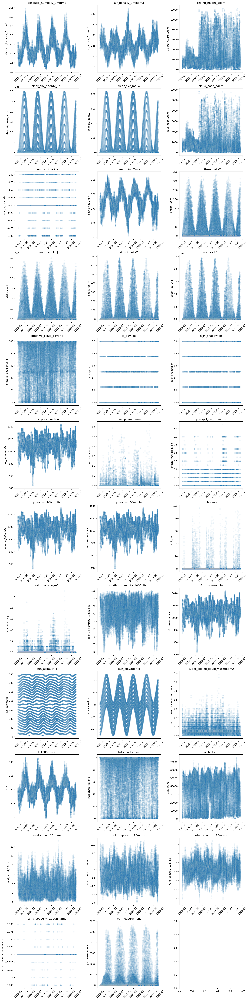

In [19]:
# because we already use the data from the wrapper, we exclude the new features in this plot
new_features = [
    'hourDayMonthYear', 'isEstimated', 'delta_forecast','dayMonthYear', 'monthYear', 'month', 'hour','GHI', 'wind_angle', 'temp*GHI',
       'wind*humidity', 'sun_height*diff_rad', 'wind_angle_sin',
       'wind_angle_cos', 'hour_sin', 'hour_cos', 'GHI_daily_mean',
       'GHI_daily_std', 'effective_cloud_cover_5h_mean', 'GHI_lag_-1h',
       'GHI_lag_1h', 'temp*GHI_lag_-1h', 'temp*GHI_lag_1h',
]

Xy_copy = Xy.copy().drop(columns=new_features)

# individual features
n_cols = 3
n_rows = Xy_copy.select_dtypes(include=np.number).shape[1] // n_cols + 1

fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))

axes = axs.flatten()

for i, col in enumerate(Xy_copy.select_dtypes(include=np.number).columns):
    sns.scatterplot(data=Xy_copy, x='date_forecast',y=col, ax=axes[i],alpha=0.05)
    for tick in axes[i].get_xticklabels():
        tick.set_rotation(45)
    axes[i].set_title(col)
    axes[i].set_xlabel('')

plt.tight_layout()
plt.show()

In the last plot all individual, numerical features are plotted over time. We did not differentiate by building id here, because most features are distributed very similarly. This is visualized in the next plot. 
When looking at the general shape of the features, we can see that many follow seasonal trends. This is especially true for theoretical or astronomic features, as clear sky radiation and sun elevation, but also features like temperature and rain. The cloud height features seem to have a concept shift at the start of 2020. 

### Lineplot

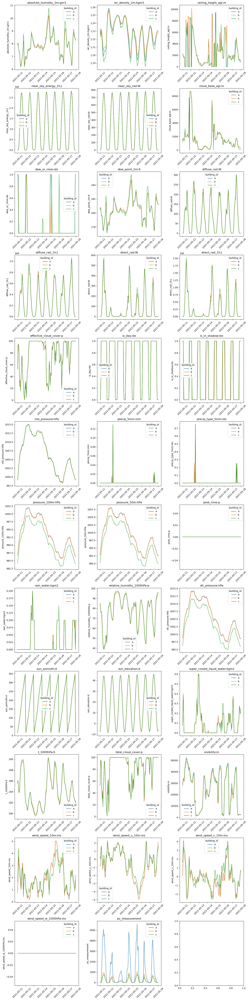

In [20]:
# individual features

# because we already use the data from the wrapper, we exclude the new features in this plot
Xy_copy = Xy.copy().fillna(0).drop(columns=new_features)

n_cols = 3
n_rows = Xy_copy.select_dtypes(include=np.number).shape[1] // n_cols + 1

fig, axs = plt.subplots(n_rows, n_cols, figsize=(15, 5*n_rows))

axes = axs.flatten()

for i, col in enumerate(Xy_copy.select_dtypes(include=np.number).columns):
    sns.lineplot(data=Xy_copy[Xy_copy.date_forecast.between('2021-05-11','2021-05-18')], x='date_forecast',y=col, ax=axes[i],alpha=0.8,hue='building_id')
    for tick in axes[i].get_xticklabels():
        tick.set_rotation(45)
    axes[i].set_title(col)
    axes[i].set_xlabel('')

plt.tight_layout()
plt.show()

This plot emphasizes the similarity of the different features for the 3 buildings. This indicates, that the buildings are located in the same area. One notable exception is the target variable pv measurement. Building A seems to have many more solar panels, as its energy production is up to 5 times higher than the other buildings. Also the pressure of building C differs significantly but not by a lot.

## Explore pairs and group of features

### Correlation matrix

<Axes: >

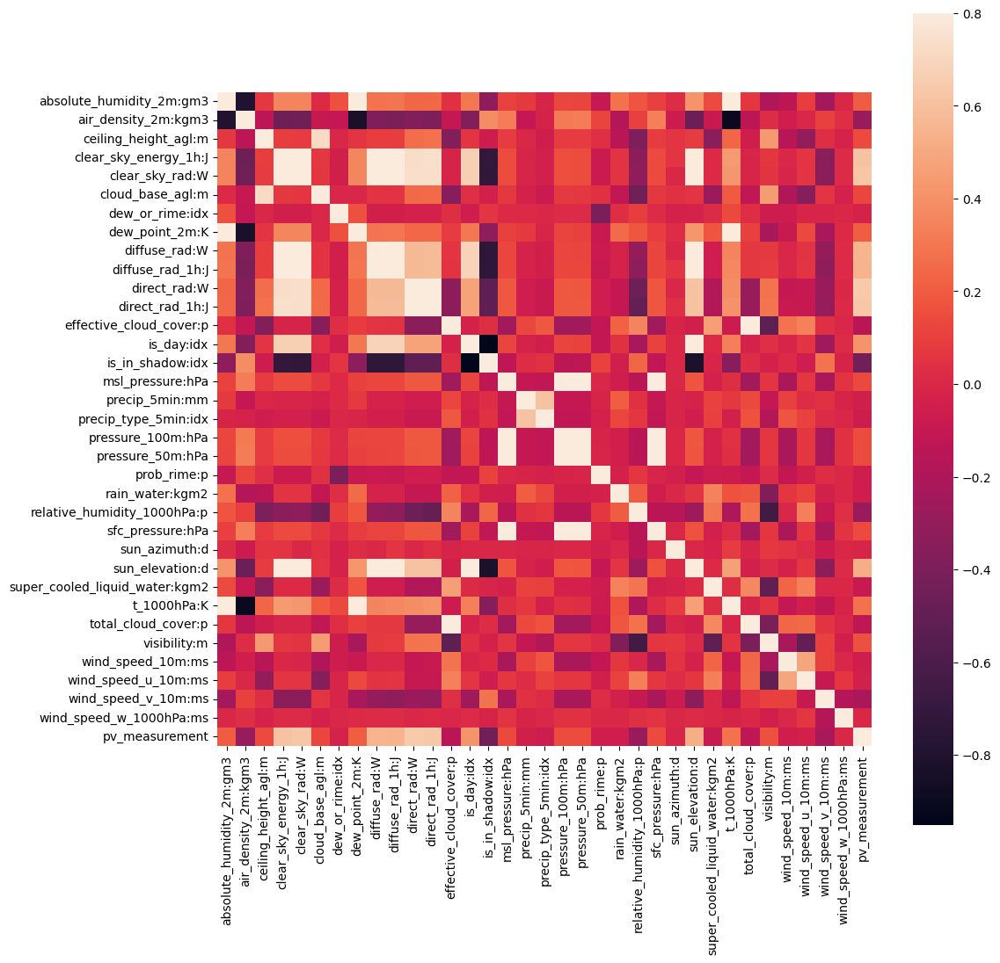

In [21]:
# groups of features


corrmat = Xy.drop(columns=new_features).corr(numeric_only=True)
plt.figure(figsize=(12, 12))
sns.heatmap(corrmat, vmax=.8, square=True)

This figure shows a correlation matrix between all features. We can see groups of features that are closely related, which is also intuitive from the features names. For example the cloud height features. Also the radiation features are correlated with each other as well as with the pv measurement. 

### pv_measurement and solar radiation

Ignoring the scale, the clear sky radiation seems to be the maximum for the pv measurement while direct and diffuse radiation more closely follow the shape of the pv measurement (next plot).

<Axes: xlabel='date_forecast', ylabel='clear_sky_rad:W'>

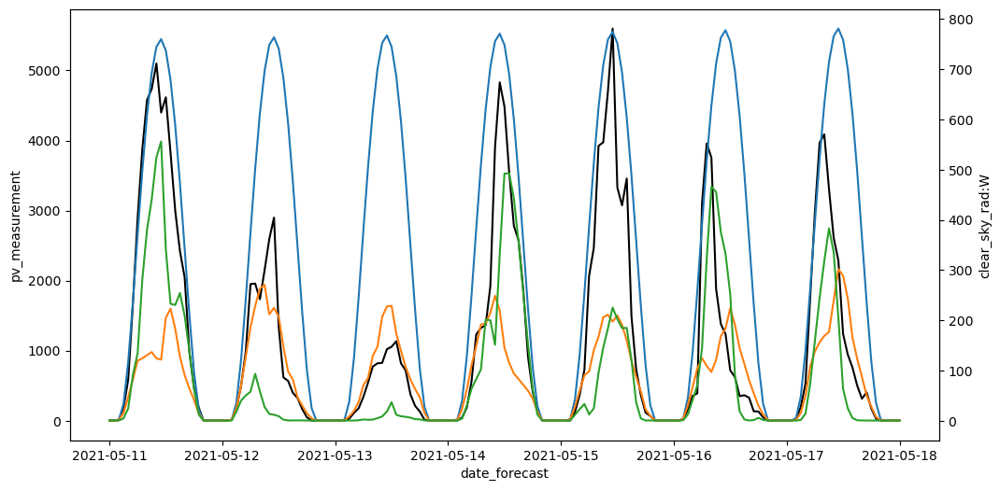

In [ ]:
# 
plt.figure(figsize=(12, 6))
ax = plt.gca()
sns.lineplot(data=Xy[Xy.date_forecast.between('2021-05-11','2021-05-18') & (Xy.building_id == 'a')], x='date_forecast',y='pv_measurement',color='black',ax=ax)
ax_twin = ax.twinx()
sns.lineplot(data=Xy[Xy.date_forecast.between('2021-05-11','2021-05-18') & (Xy.building_id == 'a')], x='date_forecast',y='clear_sky_rad:W',ax=ax_twin)
sns.lineplot(data=Xy[Xy.date_forecast.between('2021-05-11','2021-05-18') & (Xy.building_id == 'a')], x='date_forecast',y='diffuse_rad:W',ax=ax_twin)
sns.lineplot(data=Xy[Xy.date_forecast.between('2021-05-11','2021-05-18') & (Xy.building_id == 'a')], x='date_forecast',y='direct_rad:W',ax=ax_twin)


# diffuse, clear sky, total rad vs pv 

### Radiation and 1h Energy

In the next plot, we compare the different units of direct radiation. While J indicates that this measured the energy production over an hour, W indicates the power output at a certain point. Still, they are very similar.

<Axes: xlabel='direct_rad:W', ylabel='direct_rad_1h:J'>

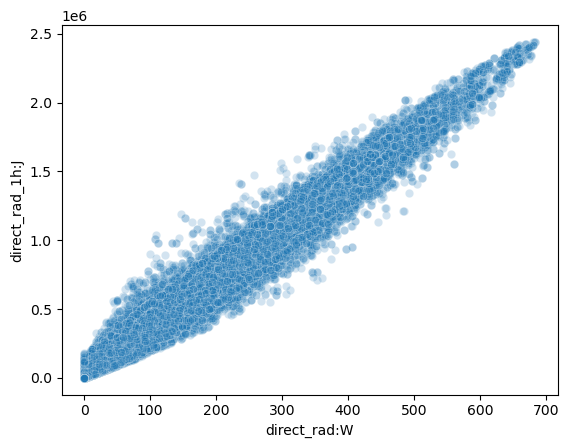

In [ ]:
# compare units of direct_rad:W', 'direct_rad_1h:J
sns.scatterplot(data=Xy, x='direct_rad:W',y='direct_rad_1h:J',alpha=0.2)

## Clean up features

### Snow
Snow is a factor that greatly influences solar energy production, in fact when the panel is covered in snow the target value is equal to zero or very low. We noticed that the behavior of the buildings is different, very often in building A the solar production resumes normally after snowfall, while for buildings B and C production often gradually increases over a few days, perhaps due to the gradual melting of the snow.
Since we know that in the test dataset, and in general in the summer months, snow is not expected, we decided to remove the days in which solar production was strongly influenced by snow.

### Elevation
In the dataset there is a feature that indicates the elevation of the solar panel. This feature is constant per building. Since the elevation difference is not enough to give additional information on the photovoltaic measurements, we decided to remove this feature and add a one hot encoding strategy to identify the three buildings.

### Target feature cleaning
We noticed that the pv measurement had long periods of production at zero or constant values. Since this behavior was not attributable to any specific reason, so we removed these values ​​considering them outliers. Furthermore, there are also missing values ​​in the target feature, which we preferred to drop rather than choose an imputing strategy.

# Feature engineering

## Feature selection

After noticing the high correlation between groups of features, we decided to adopt an algorithm for reducing the dimensionality of the dataset.
The idea was to use PCA to group highly correlated features and obtain one or maximum two uncorrelated features. We then tried to divide the features into possible groups, the final configuration is:

- Sun features: 
['clear_sky_energy_1h:J', 'clear_sky_rad:W', 'diffuse_rad:W', 'diffuse_rad_1h:J', 'direct_rad:W', 'direct_rad_1h:J', 'is_day:idx', 'is_in_shadow:idx', 'sun_elevation:d']

- Humidity features:
['absolute_humidity_2m:gm3', 'air_density_2m:kgm3', 'dew_point_2m:K', 't_1000hPa:K']

- Snow features:
['fresh_snow_12h:cm', 'fresh_snow_1h:cm', 'fresh_snow_24h:cm', 'fresh_snow_3h:cm', 'fresh_snow_6h:cm']

- Cloud height features:
['ceiling_height_agl:m', 'cloud_base_agl:m']

then we apply PCA on these groups in order to reduce their complexity.
Although the idea initially seemed to work, we decided to abandon this strategy as it made the model more complicated and reduced its explainability. Furthermore, we have in mind that the algorithms we will use to model the problem are probably not excessively penalized by the presence of less significant features. We therefore preferred to abandon this idea.


In [ ]:
#Groups
sun_features_list = ['clear_sky_energy_1h:J', 'clear_sky_rad:W', 'diffuse_rad:W', 'diffuse_rad_1h:J', 'direct_rad:W', 'direct_rad_1h:J', 'is_day:idx', 'is_in_shadow:idx', 'sun_elevation:d']

humidity_features_list = ['absolute_humidity_2m:gm3', 'air_density_2m:kgm3', 'dew_point_2m:K', 't_1000hPa:K']

cloud_height_features_list = ['ceiling_height_agl:m', 'cloud_base_agl:m']

all_features_groups = [sun_features_list,humidity_features_list,cloud_height_features_list]
all_groups_names = ['sun','humidity','cloud_height']
n_pca = [2,2,1]

#PCA function
def pca_analysis(df, features, feature_prefix, n_components, scalers):
    df = df.copy(deep=True)

    scaler = StandardScaler()
    df_scaled = scaler.fit_transform(df[features])

    pca_transformer = PCA(n_components=n_components)
    df_pca = pd.DataFrame(pca_transformer.fit_transform(df_scaled))
    df_pca.columns = [feature_prefix + "_" + str(i+1) for i in range(n_components)]

    df = df.drop(features, axis=1)
    #df = pd.concat([df, df_pca], axis=1, ignore_index=True)
    df = pd.concat([df, pd.DataFrame(df_pca)], axis=1)
    

    scalers |= {feature_prefix: {'scaler': scaler, 'pca_transformer': pca_transformer}}

    return df, scalers

#Applying PCA
all_data_pca = X.copy()
scalers = {}

for group, name, n in zip(all_features_groups, all_groups_names, n_pca):
    all_data_pca, scalers = pca_analysis(all_data_pca, group, name, n, scalers)


## Feature extraction

### GHI

To verify the proportion off diffuse and total radiation on the pv measurement, we ran a simple linear regression. 

In [ ]:
# linear regression of pv_measurement vs diffuse and direct radiation
lreg = LinearRegression(fit_intercept=False)
lreg.fit(Xy[['diffuse_rad:W','direct_rad:W']], Xy['pv_measurement'])
lreg.coef_

array([3.5266473, 3.4347792], dtype=float32)

This resulted in an equal proportion, so we created the new feature 'GHI' by adding the diffuse and direct radiation. In the next plot, you can see that GHI has similar patterns as the pv measurement.

<Axes: xlabel='date_forecast', ylabel='GHI'>

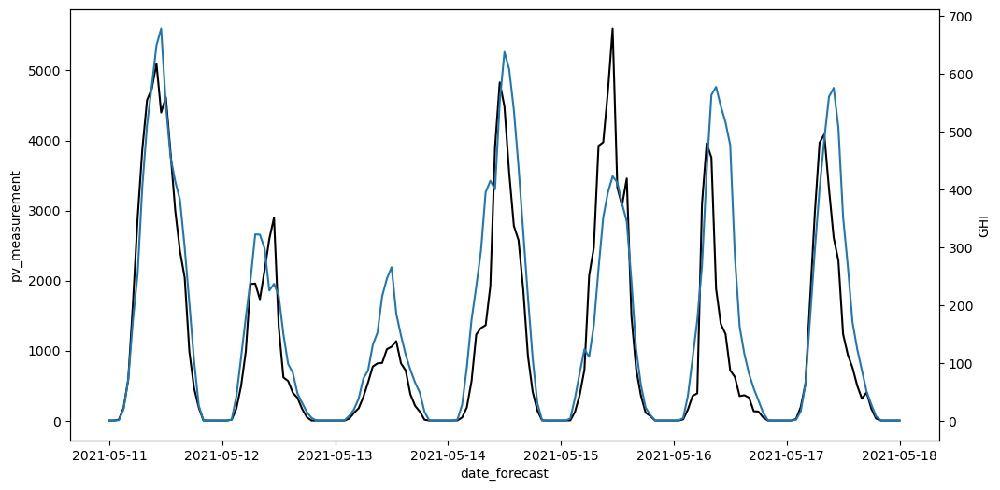

In [ ]:
# 
plt.figure(figsize=(12, 6))
ax = plt.gca()
sns.lineplot(data=Xy[Xy.date_forecast.between('2021-05-11','2021-05-18') & (Xy.building_id == 'a')], x='date_forecast',y='pv_measurement',color='black',ax=ax)
ax_twin = ax.twinx()
sns.lineplot(data=Xy[Xy.date_forecast.between('2021-05-11','2021-05-18') & (Xy.building_id == 'a')], x='date_forecast',y='GHI',ax=ax_twin)


# diffuse, clear sky, total rad vs pv 

### Temporal features

Apart from this, we added other features based on intuition and research. To give the model a sense of time, we extracted the month and hour of the day.
Since the feature hour has a discontinuity between the days we encoded it with sin and cos functions.

### Wind angle

We computed the angle of wind using its components with the arctan2 function. Then also for this feature we deal with the discontinuity using sin and cos encoding.

### Effective cloud cover mean 5h

To give to the model a wider idea of the cloud cover situation we computed a 5h mean of this features

### Interactions between features

Doing some research we added some interactions between features. The one who seems most relevant is the interaction between the temperature and GHI.

### Lag features

From our research we have found that having measurements of relevant features in the instant before and after the one we want to predict can be very useful to the model.
We decided to include the GHI and the interaction of GHI and temperature from the previous and following hours.

### Measurement aggregation methods

The measurements are every 15 minutes, while the pv measurements are every hour, so it was necessary to choose an aggregation technique for each hour. Initially we decided to always take the average of the 4 values, however at a certain point we realized that by doing so we were throwing away a lot of information, so we created a specific class that allowed us to select what type of aggregation we wanted to do.
The possible techniques are:
- Aggregation by mean
- Aggregation by standard deviation
- Aggregation by minute (00,15,30,45)
- Aggregation by minimum value
- Aggregation by maximum value

In the end we usually combine different ways of aggregation (mean + std, all minutes values, min + max, all the possibles values).

### Y scaling

Since the predictions on building a are much larger, we decided to scale y with the maximum pv detection per building. This way the model should be able to learn patterns from all buildings.

# Modeling

## Random Forest

As soon as we finished the EDA and preprocessing we applied a simple algorithm to see how it would perform. We opted for a random forest which we optimized using BayesianSearchCV.
With this type of model we obtained at most an MAE of 170 on kaggle.

In [ ]:
# exclude datetime columns
X_rf = X.select_dtypes(exclude=['datetime','timedelta','period[M]'])

# automatically set types of columns for imputing and oneHotEncoding
categorical_features = X_rf.select_dtypes(include=['object']).columns.tolist()
impute_features = X_rf.loc[:, X_rf.isna().any()].columns.tolist()

columnTransformer = ColumnTransformer(
    transformers=[
        ('imputer', SimpleImputer(strategy='constant'),impute_features),
        ('oneHotEncoder', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ],
    remainder='passthrough',  # Dont drop remaining columns
    n_jobs=-1
)

rf_pipe = Pipeline(steps=[
    ('columnTransformer', columnTransformer),
    ('estimator', RandomForestRegressor())
])

bs_rf = BayesSearchCV(
    rf_pipe,
    search_spaces={
        'estimator__max_depth': Integer(3, 13),
        'estimator__n_estimators': Integer(20,500),
        'estimator__min_samples_leaf': Integer(1,30),
    },
    cv=4,
    n_jobs=-1,
    scoring='neg_mean_absolute_error',
    verbose=2,
    n_iter=150,
    n_points=6,
    return_train_score=True
)

bs_rf.fit(X_rf,y)

Fitting 4 folds for each of 6 candidates, totalling 24 fits


## Double Model

After trying to train a random forest, we had a new idea.
At this point in the project we gave great importance to the difference between observed and estimated data.
We wanted to try to create a model that could refine the predictions made so that they were consistent with estimated data.
The structure we wanted to give to the code was to have two models.
- First model: an xgboost model that was trained only on observed data.
- Second model: a simpler model that had as input the numerical weather data on the estimated data and the forecasts made by the first model on that data. Thus our idea was that the second model would refine the forecasts to better match solar production on days when only estimated values ​​are available.

This idea turned out to be not very good since the estimated data focuses on the winter months. This led to completely wrong predictions. This approach never gave sufficient results so it was abandoned.

In [ ]:
# exclude datetime columns
X_double = X.select_dtypes(exclude=['datetime','timedelta','period[M]'])

# automatically set types of columns for imputing and oneHotEncoding
categorical_features = X_double.select_dtypes(include=['object']).columns.tolist()
impute_features = X_double.loc[:, X_double.isna().any()].columns.tolist()

Xo = X_double[X_double['isEstimated'] == 1]
yo = y[X_double['isEstimated'] == 1]


Xe = X_double[X_double['isEstimated'] == 0]
ye = y[X_double['isEstimated'] == 0]


columnTransformer = ColumnTransformer(
    transformers=[
        ('imputer', SimpleImputer(strategy='constant'),impute_features),
        ('oneHotEncoder', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ],
    remainder='passthrough',  # Dont drop remaining columns
    n_jobs=-1
)

first_model = Pipeline(steps=[
    ('columnTransformer', columnTransformer),
    ('estimator', XGBRegressor())
])

bs_first_model = BayesSearchCV(
    first_model,
    search_spaces={
        'estimator__learning_rate': Real(0.05, 0.3),
        'estimator__max_depth': Integer(3, 13),
        'estimator__n_estimators': Integer(20,500),
        'estimator__colsample_bytree': Real(0.001,1),
        'estimator__reg_alpha': Real(0, 50),
        'estimator__reg_lambda': Real(0, 50),
        'estimator__min_child_weight': Real(0,50)
    },
    cv=4,
    n_jobs=-1,
    scoring='neg_mean_absolute_error',
    verbose=2,
    n_iter=150,
    n_points=6,
    return_train_score=True
)

bs_first_model.fit(Xo,yo)

first_model_pred = bs_first_model.best_estimator_.predict(Xe)

Xe['first_prediction'] = first_model_pred

second_model = LinearRegression()

second_model.fit(Xe,ye)

Fitting 4 folds for each of 6 candidates, totalling 24 fits


## Changing idea on splitting

After these attempts we decided to give more importance to the season of predictions rather than whether the data were observed or estimated.
We therefore began to exclude the winter months from model training and validate our models on samples similar to those of the test dataset, i.e. on a dataset containing only the months of May and June.

## XGBoost

We then tried again to train an XGBoost model with the considerations just made and this increased the performance, obtaining a score of around 160

In [ ]:
X_xgb_model = X.copy()

val_idx = X_xgb_model['date_forecast'].between('2020-05-01', '2020-07-01')-1
ps = PredefinedSplit(test_fold=val_idx)

# exclude datetime columns
X_xgb_model = X_xgb_model.select_dtypes(exclude=['datetime','timedelta','period[M]'])

# automatically set types of columns for imputing and oneHotEncoding
categorical_features = X_xgb_model.select_dtypes(include=['object']).columns.tolist()
impute_features = X_xgb_model.loc[:, X_xgb_model.isna().any()].columns.tolist()

columnTransformer = ColumnTransformer(
    transformers=[
        ('imputer', SimpleImputer(strategy='constant'),impute_features),
        ('oneHotEncoder', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ],
    remainder='passthrough', 
    n_jobs=-1
)

xgb_model = Pipeline(steps=[
    ('columnTransformer', columnTransformer),
    ('estimator', XGBRegressor())
])

bs_xgb_model = BayesSearchCV(
    xgb_model,
    search_spaces={
        'estimator__learning_rate': Real(0.05, 0.3),
        'estimator__max_depth': Integer(3, 13),
        'estimator__n_estimators': Integer(20,500),
        'estimator__colsample_bytree': Real(0.001,1),
        'estimator__reg_alpha': Real(0, 50),
        'estimator__reg_lambda': Real(0, 50),
        'estimator__min_child_weight': Real(0,50)
    },
    cv=ps,
    n_jobs=-1,
    scoring='neg_mean_absolute_error',
    verbose=2,
    n_iter=150,
    n_points=6,
    return_train_score=True
)

bs_xgb_model.fit(X_xgb_model,y)

Fitting 1 folds for each of 6 candidates, totalling 6 fits


## LightGBM

After trying the XGBoost model we decided to see how other models would perform. We started by training a LightGBM model. We also changed the hyperparameter tuning process from BayesSearchCV to GridSearchCV, where we tried to tune the model in a more manual way.

In [ ]:

X_lgbm_model = X.copy()

val_idx = X_lgbm_model['date_forecast'].between('2020-05-01', '2020-07-01')-1
ps = PredefinedSplit(test_fold=val_idx)

# exclude datetime columns
X_lgbm_model = X_lgbm_model.select_dtypes(exclude=['datetime','timedelta','period[M]'])

# automatically set types of columns for imputing and oneHotEncoding
categorical_features = X_lgbm_model.select_dtypes(include=['object']).columns.tolist()
impute_features = X_lgbm_model.loc[:, X_lgbm_model.isna().any()].columns.tolist()

columnTransformer = ColumnTransformer(
    transformers=[
        ('imputer', SimpleImputer(strategy='constant'),impute_features),
        ('oneHotEncoder', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ],
    remainder='passthrough', 
    n_jobs=-1
)

lgbm_model = Pipeline(steps=[
    ('columnTransformer', columnTransformer),
    ('estimator', LGBMRegressor())
])

lgbm_gs = GridSearchCV(
    lgbm_model,
    param_grid={
        'estimator__verbose': [1],
        'estimator__n_estimators': np.arange(50,300,25),
        'estimator__learning_rate':[0.2,0.1,0.07,0.05,0.03,0.01,0.005,0.001],
        'estimator__max_depth':[-1]+list(np.arange(13,3,-1)),
        'estimator__bagging_fraction':np.arange(0.1,1.0001,0.025),
        'estimator__bagging_freq':np.arange(1,10,1),
        'estimator__feature_fraction':np.arange(0.1,1.0001,0.025),
    },
    cv=ps,
    n_jobs=-1,
    scoring='neg_mean_absolute_error',
    verbose=2,
)

lgbm_gs.fit(X_lgbm_model,y)

## Catboost with new aggregation

At this point we also started using data that was not just the average of the 4 values ​​present in the hour but with the various aggregation strategies. In particular we tried to use all the new features. This resulted in a dataframe with about 500 columns. With this we achieved a score just below 150 for the first time.

In [ ]:
agg_strats = ['mean','00','15','30','45','min','max','std']

m_wrap = DataWrapper(
    impute_strategy = 'fbfill',
    aggregation_strats = agg_strats,
    y_scalers = [Y_Scaler_MaxAbs_per_building()],
    transform_pred_strategy = [],
    training_filters=training_filters,
    validation_filters=validation_filters,
    test_filters=test_filters,
    bagging_filters=False, # these are applied additionally to the other filters on val, test, sub
    )

X_catboost_model, y = m_wrap.get_train(True,False, False, False)

val_idx = X_catboost_model['date_forecast'].between('2020-05-01', '2020-07-01')-1
ps = PredefinedSplit(test_fold=val_idx)

# exclude datetime columns
X_catboost_model = X_catboost_model.select_dtypes(exclude=['datetime','timedelta','period[M]'])

# automatically set types of columns for imputing and oneHotEncoding
categorical_features = X_catboost_model.select_dtypes(include=['object']).columns.tolist()
impute_features = X_catboost_model.loc[:, X_catboost_model.isna().any()].columns.tolist()

columnTransformer = ColumnTransformer(
    transformers=[
        ('imputer', SimpleImputer(strategy='constant'),impute_features),
        ('oneHotEncoder', OneHotEncoder(handle_unknown='ignore'), categorical_features),
    ],
    remainder='passthrough', 
    n_jobs=-1
)

catboost_model = Pipeline(steps=[
    ('columnTransformer', columnTransformer),
    ('estimator', CatBoostRegressor)
])

catboost_gs = GridSearchCV(
    catboost_model,
    param_grid={
        'estimator__verbose': [1],
        'estimator__n_estimators': np.arange(50,300,25),
        'estimator__learning_rate':[0.2,0.1,0.07,0.05,0.03,0.01,0.005,0.001],
        'estimator__max_depth':[-1]+list(np.arange(13,3,-1)),
        'estimator__bagging_fraction':np.arange(0.1,1.0001,0.025),
        'estimator__bagging_freq':np.arange(1,10,1),
        'estimator__feature_fraction':np.arange(0.1,1.0001,0.025),
    },
    cv=ps,
    n_jobs=-1,
    scoring='neg_mean_absolute_error',
    verbose=2,
)

catboost_gs.fit(X_lgbm_model,y)

## Ensembling 

We tried some ensembling strategy to increase our performance. We structured our ensembled model as the ensembling of 3 different aggregation strategies.
All the strategies use CatBoost, with varying aggregation strategies.
We ensemble models that are trained on:
- mean and std
- minimum and maximum
- all the possible aggregations

We also have noticed that individual predictions for different random seeds varies, so we tried to ensemble for each strategy 8 different models with different random seeds so we can have a more stable output.

In [22]:
models = []

#Creating df for agreggating predictions of differnt model
agg_strats = ['mean']

m_wrap = DataWrapper(
    impute_strategy = 'fbfill',
    aggregation_strats = agg_strats,
    y_scalers = [Y_Scaler_MaxAbs_per_building()],
    transform_pred_strategy = [],
    training_filters=training_filters,
    validation_filters=validation_filters,
    test_filters=test_filters,
    bagging_filters=False, # these are applied additionally to the other filters on val, test, sub
    )

predictions = m_wrap.get_sub(aggregated=True)

X,y = m_wrap.get_train(aggregated=False, drop_test=False, drop_val=False) 

#Model 1 min max------------------------------------------------------------------------------------------------
agg_strats = ['min','max']
rand_incr = 1
name = 'MinMax'
depth = 12

m_wrap = DataWrapper(
    impute_strategy = 'fbfill',
    aggregation_strats = agg_strats,
    y_scalers = [Y_Scaler_MaxAbs_per_building()],
    transform_pred_strategy = [],
    training_filters=training_filters,
    validation_filters=validation_filters,
    test_filters=test_filters,
    bagging_filters=False, # these are applied additionally to the other filters on val, test, sub
    )

X_train_agg, y_train_agg = m_wrap.get_train(aggregated=True,drop_val=False,drop_test=False,y_scaled=True)
X_train_agg = X_train_agg.select_dtypes(exclude=['datetime','timedelta','period[M]'])

X_sub_agg = m_wrap.get_sub(aggregated=True)

# automatically set types of columns for imputing and oneHotEncoding
categorical_features = X_train_agg.select_dtypes(include=['object']).columns.tolist()
impute_features = X_train_agg.loc[:, X_train_agg.isna().any()].columns.tolist()

models_this_agg = []
for i in range(8):
    # automatically set types of columns for imputing and oneHotEncoding
    columnTransformer = ColumnTransformer(
        transformers=[
            ('imputer', SimpleImputer(strategy='constant'),impute_features),
            ('oneHotEncoder', OneHotEncoder(handle_unknown='ignore'), categorical_features),
        ],
        remainder='passthrough',  # Dont drop remaining columns
        n_jobs=-1
    )

    mod = CatBoostRegressor(
        objective='MAE',
        iterations=800,
        depth=depth,
        random_seed=i*100+rand_incr,
    )

    model = Pipeline(steps=[
        ('columnTransformer', columnTransformer),
        ('estimator', mod)
    ])


    model.fit(X_train_agg, y_train_agg)
    pred_sub = pd.Series(model.predict(X_sub_agg))
    pred_sub = pd.Series(m_wrap.transform_prediction(pred_sub, X_sub_agg))

    predictions[f'{name}_{i}'] = pred_sub
    models_this_agg.append(model)
models.append(models_this_agg)


# Model 2 mean std----------------------------------------------------------------------------------------------
agg_strats = ['mean','std']
rand_incr = 2
name = 'MeanStd'
depth = 12

m_wrap = DataWrapper(
    impute_strategy = 'fbfill',
    aggregation_strats = agg_strats,
    y_scalers = [Y_Scaler_MaxAbs_per_building()],
    transform_pred_strategy = [],
    training_filters=training_filters,
    validation_filters=validation_filters,
    test_filters=test_filters,
    bagging_filters=False, # these are applied additionally to the other filters on val, test, sub
    )

X_train_agg, y_train_agg = m_wrap.get_train(aggregated=True,drop_val=False,drop_test=False,y_scaled=True)
X_train_agg = X_train_agg.select_dtypes(exclude=['datetime','timedelta','period[M]'])

X_sub_agg = m_wrap.get_sub(aggregated=True)

# automatically set types of columns for imputing and oneHotEncoding
categorical_features = X_train_agg.select_dtypes(include=['object']).columns.tolist()
impute_features = X_train_agg.loc[:, X_train_agg.isna().any()].columns.tolist()

models_this_agg = []
for i in range(8):
    # automatically set types of columns for imputing and oneHotEncoding
    columnTransformer = ColumnTransformer(
        transformers=[
            ('imputer', SimpleImputer(strategy='constant'),impute_features),
            ('oneHotEncoder', OneHotEncoder(handle_unknown='ignore'), categorical_features),
        ],
        remainder='passthrough',  # Dont drop remaining columns
        n_jobs=-1
    )

    mod = CatBoostRegressor(
        objective='MAE',
        iterations=800,
        depth=depth,
        random_seed=i*100+rand_incr,
    )

    model = Pipeline(steps=[
        ('columnTransformer', columnTransformer),
        ('estimator', mod)
    ])


    model.fit(X_train_agg, y_train_agg)
    pred_sub = pd.Series(model.predict(X_sub_agg))
    pred_sub = pd.Series(m_wrap.transform_prediction(pred_sub, X_sub_agg))

    predictions[f'{name}_{i}'] = pred_sub
    models_this_agg.append(model)
models.append(models_this_agg)



#Model 3 every aggregation--------------------------------------------------------------------------------------
agg_strats = ['mean','std','min','max','00','15','30','45']
rand_incr = 3
name = 'Everything'
depth = 12

m_wrap = DataWrapper(
    impute_strategy = 'fbfill',
    aggregation_strats = agg_strats,
    y_scalers = [Y_Scaler_MaxAbs_per_building()],
    transform_pred_strategy = [],
    training_filters=training_filters,
    validation_filters=validation_filters,
    test_filters=test_filters,
    bagging_filters=False, # these are applied additionally to the other filters on val, test, sub
    )

X_train_agg, y_train_agg = m_wrap.get_train(aggregated=True,drop_val=False,drop_test=False,y_scaled=True)
X_train_agg = X_train_agg.select_dtypes(exclude=['datetime','timedelta','period[M]'])

X_sub_agg = m_wrap.get_sub(aggregated=True)

# automatically set types of columns for imputing and oneHotEncoding
categorical_features = X_train_agg.select_dtypes(include=['object']).columns.tolist()
impute_features = X_train_agg.loc[:, X_train_agg.isna().any()].columns.tolist()

models_this_agg = []
for i in range(8):
    # automatically set types of columns for imputing and oneHotEncoding
    columnTransformer = ColumnTransformer(
        transformers=[
            ('imputer', SimpleImputer(strategy='constant'),impute_features),
            ('oneHotEncoder', OneHotEncoder(handle_unknown='ignore'), categorical_features),
        ],
        remainder='passthrough',  # Dont drop remaining columns
        n_jobs=-1
    )

    mod = CatBoostRegressor(
        objective='MAE',
        iterations=800,
        depth=depth,
        random_seed=i*100+rand_incr,
    )

    model = Pipeline(steps=[
        ('columnTransformer', columnTransformer),
        ('estimator', mod)
    ])


    model.fit(X_train_agg, y_train_agg)
    pred_sub = pd.Series(model.predict(X_sub_agg))
    pred_sub = pd.Series(m_wrap.transform_prediction(pred_sub, X_sub_agg))

    predictions[f'{name}_{i}'] = pred_sub
    models_this_agg.append(model)
models.append(models_this_agg)

pred_only_pred = predictions.iloc[:,-24:]
predictions['mean'] = pred_only_pred.mean(axis=1)

0:	learn: 0.0966799	total: 74.9ms	remaining: 59.8s
1:	learn: 0.0943126	total: 87.8ms	remaining: 35s
2:	learn: 0.0923660	total: 102ms	remaining: 27.2s
3:	learn: 0.0903793	total: 116ms	remaining: 23.2s
4:	learn: 0.0884538	total: 129ms	remaining: 20.5s
5:	learn: 0.0863926	total: 142ms	remaining: 18.8s
6:	learn: 0.0845726	total: 154ms	remaining: 17.5s
7:	learn: 0.0828703	total: 168ms	remaining: 16.6s
8:	learn: 0.0810116	total: 182ms	remaining: 16s
9:	learn: 0.0792901	total: 198ms	remaining: 15.7s
10:	learn: 0.0775327	total: 211ms	remaining: 15.1s
11:	learn: 0.0759578	total: 223ms	remaining: 14.7s
12:	learn: 0.0741874	total: 235ms	remaining: 14.2s
13:	learn: 0.0726341	total: 246ms	remaining: 13.8s
14:	learn: 0.0714540	total: 258ms	remaining: 13.5s
15:	learn: 0.0699259	total: 270ms	remaining: 13.2s
16:	learn: 0.0684005	total: 282ms	remaining: 13s
17:	learn: 0.0668579	total: 294ms	remaining: 12.8s
18:	learn: 0.0655219	total: 306ms	remaining: 12.6s
19:	learn: 0.0641990	total: 317ms	remaining: 

## Postprocessing 

In the end we postprocess our results to don't have negative predictions and also to put at zero the prediction with a negative sun elevation (no production on night)

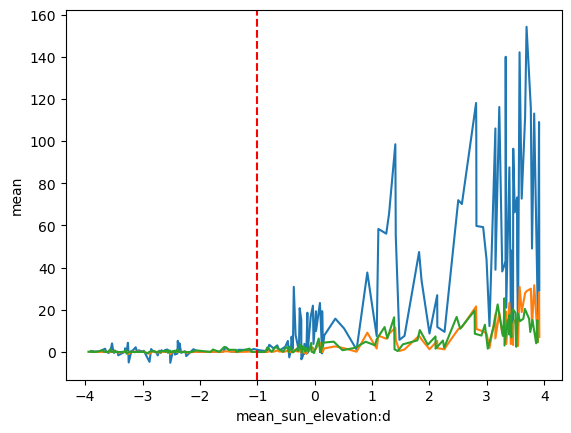

In [39]:

sns.lineplot(data=predictions[predictions['mean_sun_elevation:d'].between(-4,4)], x='mean_sun_elevation:d', y='mean', hue='building_id', legend=False)
ax = plt.gca()
ax.axvline(-1, color='red', linestyle='--')

predictions['mean'] = predictions['mean'].clip(0)
predictions.loc[predictions['mean_sun_elevation:d'] <-1,'mean'] = 0


# Model interpretation

We are ensembling 3*8=24 models. These models have different aggregation strategies and therefore different features, so we decided not to aggregate the feature importances. For simplicity we only show the feature importances for 2 random seeds per model configuration.

As we saw in our analysis, the radiation features seem to be good predictors of the pv measurement. This is confirmed in the various feature importance plots as the radiation features (clear sky radiation, direct radiation, ...) always have a high feature importance. The features, that we created also show up on the most important features. This includes the GHI,  lagged features, the 5h mean of the cloud cover and interactions between features.
Another interesting observation is that models with the same configuration but different seeds still vary significantly in their feature importance. By this we already introduce some variability between the ensembled models.

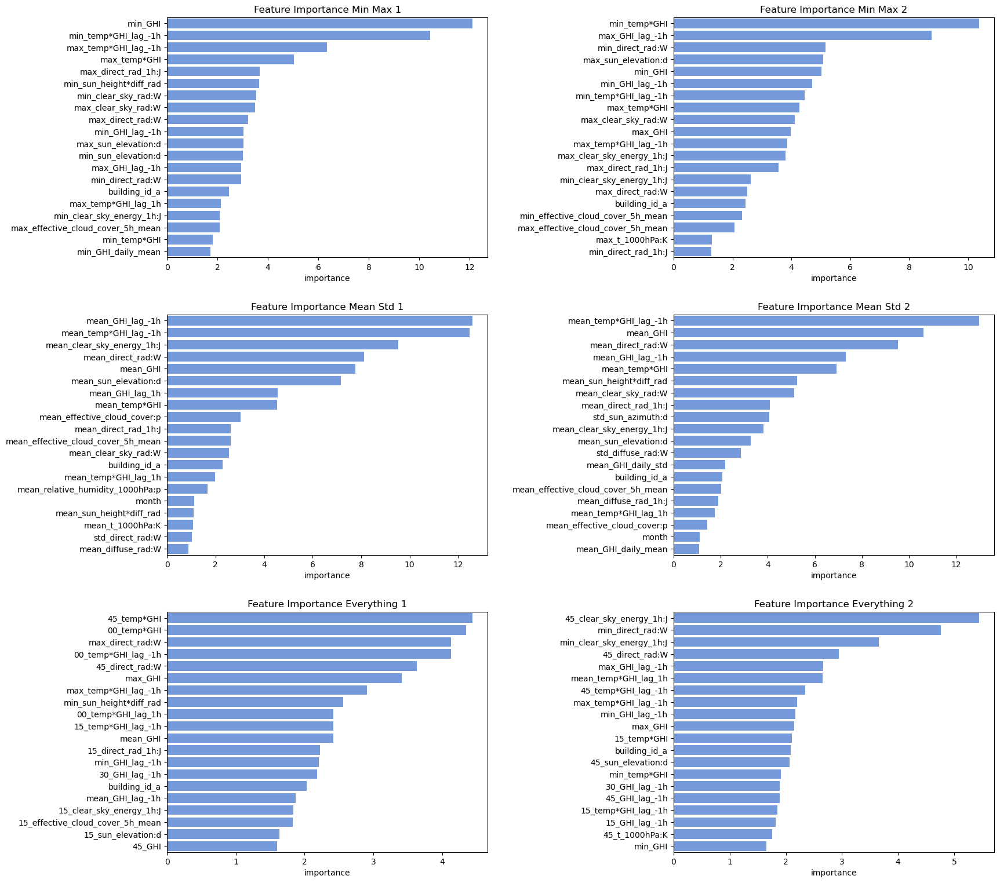

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

<Figure size 1200x500 with 0 Axes>

In [36]:
titles = [
    ['Min Max 1',
    'Min Max 2'],
    ['Mean Std 1',
    'Mean Std 2'],
    ['Everything 1',
    'Everything 2'],
]

n_cols = 2
n_rows = len(models)

f,axs = plt.subplots(n_rows,n_cols,figsize=(15,5*n_rows))
plt.tight_layout(w_pad=20,h_pad=5)

for j, mod_agg in enumerate(models):
    for i, model in enumerate(mod_agg):
        if i <= 1:
            f_names = model.steps[0][1].get_feature_names_out()
            f_names = [f.split('__')[1] if '__' in f else f for f in f_names]
            
            feature_importance = model.steps[1][1].feature_importances_
            f_df = pd.DataFrame({'feature name':f_names,'importance':feature_importance})

            plt.figure(figsize=(12, 5))
            f = sns.barplot(data=f_df.sort_values('importance',ascending=False).iloc[:20,:],x='importance',y='feature name',color='cornflowerblue',ax= axs[j,i])
            f.set(ylabel=None)
            axs[j,i].set_title(f'Feature Importance {titles[j][i]}')